# <font color='blue'>Capstone A</font>
## <font color='blue'>Using Hospital Bed Capacity Prediction During COVID-19 to Determine Feature Importance</font>

<b>Abstract.</b>  The Covid-19 pandemic has led to the generation of multiple types of models and feature selection methods in the field of Machine Learning. Since there has been rapid change and new regulations being introduced during the pandemic, modeling and feature selection methods have become increasingly complicated. The purpose of this study is to investigate and dive into key features to help create an understanding for the public and help show preventive measures. This study focuses on the exploration of feature selection though building multiple models, one simple linear model, one more complex model and an average of the two for prediction on impatient hospitalization rates.<br><br>

<b>Authors:</b>
* Helene Barrera, SMU MSDS Student
* Justin Ehly, SMU MSDS Student
* Blake Freeman, SMU MSDS Student
* Brad Blanchard, SMU Faculty
* Chris Papesh, UNLV Faculty

In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import copy


In [2]:
# helper function to correctly point Justin's python to the correct platform (windows vs osX)
def justin_chdir():
    from sys import platform

    # windows: be sure so to change the <file> location
    if platform == 'win32': os.chdir(r'C:\Users\justi\github\covid_Capstone\data')

    # Mac OSX: be sure so to change the <file> location
    elif platform == 'darwin': os.chdir('/users/justinehly/github/covid_capstone/data')

justin_chdir()

In [3]:
#Helene's data import
#os.chdir(r'D:\MS in Data Science\Capstone\Data')

In [4]:
states = ['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA', 'HI', 'IA', 'ID', 'IL',
            'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME', 'MI', 'MN', 'MO', 'MS', 'MT', 'NC', 'ND', 'NE',
            'NH', 'NJ', 'NM', 'NV', 'NY', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT',
            'VA', 'VT', 'WA', 'WI', 'WV', 'WY']

In [5]:
df = pd.read_csv('OxCGRT_latest.csv', low_memory=False)

# create dataframe of only USA State level data
oxford = copy.deepcopy(df.loc[(df.CountryCode == 'USA') & (~df.RegionCode.str[-2:].isin(states))]) 
oxford.reset_index(drop=True, inplace=True)

# create dataframe of the states level data
oxstates = copy.deepcopy(df.loc[(df.CountryCode == 'USA') & (df.RegionCode.str[-2:].isin(states))]) 

# add RegionCode to the USA data
oxford.RegionCode = 'US'

# fix state codes
oxstates.RegionCode = oxstates.RegionCode.str[-2:]

del df

In [6]:
#oxford.info()
#set(oxstates.RegionCode)

In [7]:
#oxstates.info()


In [8]:
# fix date column
from datetime import datetime

def fix_cols(data):
    # put the state column first (this will help when dealing with data later)
    cols = list(data.columns)
    cols = [cols[-1]] + cols[:-1]
    data = data[cols]
    return data

def fix_date(data):
    data.Date = pd.to_datetime(data.Date, format='%Y%m%d')

    # create the state column for the data merge (this was determined at a later date from the initial pull and added back into the main pipeline)
    data['state'] = data.RegionCode.str.slice(-2)

    # put the state column first (this will help when dealing with data later)
    data = fix_cols(data)

    # drop 'CountryName', 'CountryCode', 'RegionName', 'RegionCode','Jurisdiction' because they will not be needed moving forward since we are working at the state level and only in the USA
    # drop the wildcard since it is blank
    # drop StringentLegacyIndexForDisplay because it is recommended to not use and is an approximation of the newer StringencyIndex. Documentation says it can be included for continuity purposes
    # drop the index columns that do not contain the name display
    
    data = data.drop(columns =['CountryName', 'CountryCode', 'RegionName', 'RegionCode',
        'Jurisdiction', 'M1_Wildcard', 'StringencyLegacyIndexForDisplay', 'StringencyLegacyIndex', 'StringencyIndex', 'GovernmentResponseIndex', 
        'ContainmentHealthIndex', 'EconomicSupportIndex'])
    return data

# reduce oxford df to friday 01-24-20 thru thursday 05-27-21 to match the other data set from the USGovt website
def week_reset(data):
    data.reset_index(inplace=True, drop=True)
    start_date = pd.to_datetime('20200327')  
    end_date = pd.to_datetime('20210923')
    date_reduce_idx = np.where((data.Date >= start_date) & (data.Date <= end_date))
    data = data.loc[date_reduce_idx]
    data.reset_index(inplace=True, drop=True)
    min(data.Date), max(data.Date)
    return data





In [9]:
# get date range


oxford = fix_date(oxford)
oxstates = fix_date(oxstates)

oxford = week_reset(oxford)
oxstates = week_reset(oxstates)
print('Total weeks in the oxford dataset: %d' % (oxford.shape[0]/7))
print('Total weeks in the oxstates dataset: %d' % (oxstates.shape[0]/7/51))
print(oxford.Date.min(), oxford.Date.max())
print(oxstates.Date.min(), oxford.Date.max())




Total weeks in the oxford dataset: 78
Total weeks in the oxstates dataset: 78
2020-03-27 00:00:00 2021-09-23 00:00:00
2020-03-27 00:00:00 2021-09-23 00:00:00


---
### <font color='blue'>Missing Values</font>
---
codebook https://github.com/OxCGRT/covid-policy-tracker/blob/master/documentation/codebook.md

- <b>Indidcators and Flags C1 - H8</b> 
    - Indicators (with the exception of E3 (USD) 0 = no new spending that day, E4 (USD) 0 = no new spending that day, H4 (USD)  0 = no new spending that day, H5 (USD) 0 = no new spending that day and M1) are oridinal and used to compute the indicies so should remain ordinal, but as integers and within the original range
    - Flags are binary and are weights for the indicators so NaN are ok to impute at 0, if there is NaN between 0-1, then it is suggested to take the average to via interpolation to not create unnecessary bias
    - Index are computed values from the Indicators and corresponding Flags based on algorithms. 
        - There are 2 versions of the index reported, 
            - Regular version that will return null there is not enough data for the calcutionn
            - ***Display version that is a smoother version and is extrapolated using the previous 7 days if there is complete data \* <font color='blue'>Suggest to use this version</font>***
            - https://github.com/OxCGRT/covid-policy-tracker/blob/master/documentation/index_methodology.md

    <br><br>
- <b>Changes to be aware of:</b>
    - 27 September 2021: E3, E4 and H4 no long updated...suggest to drop these since they are not used to calculate any of the index measures
    - 28 June 2021: v3.3 presenting the imputed vaccine indicators (V2 summary and V3 summary) into a separate table
    - 21 June 2021: v3.02 edits to vaccine policy indicators table, fixing age ranges12 June 2021: v3.01 added section for vaccine policies
    - 5 May 2021: v2.10 added 'or all businesses open with alterations resulting in significant differences compared to non-Covid-19 operations' to C2 level 1
    - 18 March 2021: v2.9 added H8 'Protection of elderly people' indicator
    - 05 March 2021: v2.8 added 'non elderly' to definition of Clinically vulnerable groups' for H7
    - 14 January 2021: v2.7 changed 'country' to 'country/territory' and removed 'private' from C4 definition, replaced E1 flag 'formal sector workers only' to 'formal sector workers only or informal sector workers only', and 'informal workers too' to 'all workers'

In [10]:
# separate the indicators (orindal indicies) from the flags (binary weights) and the indicies for imputing
def sep_indicators(arg):
    cols = list(arg.columns)

    flags = [feat for feat in cols if feat[-4:] == 'Flag'] # just get a list of the flags

    indicators = [feat for feat in cols[2:34] if feat[-4:] != 'Flag'] # get a list of the indicators


    index = [item for item in cols[2:] if ((item not in flags) and (item not in indicators))] # list of the indicies without the state or date that are cols[:2]

    # Drop the Index rows and keep the IndexDisplay rows that are smoothed from the dataset creators
    #idx_to_drop = [i for i in index[2:] if (i[-7:] != 'Display')] 
    #display_idx = [i for i in index[2:] if (i[-7:] == 'Display')] # just keep the Display Indicies
    return flags, indicators #idx_to_drop, display_idx


# impute missing Flag values
def flag_impute(flags):
    flags = flags
    for x,c in enumerate(flags): # cycle through the cols
        for i in range(len(flags[c])):  # cycle through each row
            if np.isnan(flags.iloc[i,x]):
                if (i == 0): flags.iloc[i,x] = 0  # first cell is NaN set to 0
                elif (i != (len(flags[c])-1)):
                    # prior cell = 0 (0, NaN, next_cell)
                    if (flags.iloc[i-1,x] == 0) & (np.isnan(flags.iloc[i+1, x])): flags.iloc[i,x] = 0 # (0, NaN, NaN), set to 0
                    elif (flags.iloc[i-1,x] == 0) & (flags.iloc[i+1, x] == 1): flags.iloc[i,x] = 0.5 # (0, NaN, 1), set to 0.5
                    elif (flags.iloc[i-1,x] == 0) & (flags.iloc[i+1, x] == 0): flags.iloc[i,x] = 0 # (0, NaN, 0), set to 0

                    #pior cell = 1 (1, NaN, next_cell)
                    elif (flags.iloc[i-1,x] == 1) & (np.isnan(flags.iloc[i+1, x])): flags.iloc[i,x] = 0 # (1, NaN, NaN), set to 0
                    elif (flags.iloc[i-1,x] == 1) & (flags.iloc[i+1, x] == 1): flags.iloc[i,x] = 1 # (1, NaN, 1), set to 1
                    elif (flags.iloc[i-1,x] == 1) & (flags.iloc[i+1, x] == 0): flags.iloc[i,x] = 0.5 # (1, NaN, 0), set to 0.5 (not biased)
                else: flags.iloc[i,x] = flags.iloc[i-1,x]

    return flags



In [11]:

flags, indicators = sep_indicators(oxford)

flags_st, indicators_st = sep_indicators(oxstates)

# impute missing flag values for each dataset
oxford_flags = copy.deepcopy(oxford[flags])
oxford[flags] = flag_impute(oxford_flags)

oxstate_flags = copy.deepcopy(oxstates[flags_st])
oxstates[flags] = flag_impute(oxstate_flags)



In [12]:
# impute missing Indicator values using interpolate with limit not set, so that all NaN's in long stretches are filled in, more than likely with a zero.
# this data wll be combined to form weekly data and a mean of the index will be taken in each row and then rounded for a final result
def impute_indic(data):
    data = data.interpolate(method = 'linear', axis = 0, limit_direction = 'both').round()
    data = data.round(decimals=0) # these are indicators and technically categorical, but they are used to produce the index measures
    return data

oxford_ind = copy.deepcopy(oxford[indicators])
oxford[indicators] = impute_indic(oxford_ind)


oxstate_ind = copy.deepcopy(oxstates[indicators_st])
oxstates[indicators_st] = impute_indic(oxstate_ind)           
     

In [13]:
print(oxford[indicators].isnull().sum())



C1_School closing                        0
C2_Workplace closing                     0
C3_Cancel public events                  0
C4_Restrictions on gatherings            0
C5_Close public transport                0
C6_Stay at home requirements             0
C7_Restrictions on internal movement     0
C8_International travel controls         0
E1_Income support                        0
E2_Debt/contract relief                  0
E3_Fiscal measures                       0
E4_International support                 0
H1_Public information campaigns          0
H2_Testing policy                        0
H3_Contact tracing                       0
H4_Emergency investment in healthcare    0
H5_Investment in vaccines                0
H6_Facial Coverings                      0
H7_Vaccination policy                    0
H8_Protection of elderly people          0
dtype: int64


In [14]:
print(oxstates[indicators].isnull().sum())


C1_School closing                        0
C2_Workplace closing                     0
C3_Cancel public events                  0
C4_Restrictions on gatherings            0
C5_Close public transport                0
C6_Stay at home requirements             0
C7_Restrictions on internal movement     0
C8_International travel controls         0
E1_Income support                        0
E2_Debt/contract relief                  0
E3_Fiscal measures                       0
E4_International support                 0
H1_Public information campaigns          0
H2_Testing policy                        0
H3_Contact tracing                       0
H4_Emergency investment in healthcare    0
H5_Investment in vaccines                0
H6_Facial Coverings                      0
H7_Vaccination policy                    0
H8_Protection of elderly people          0
dtype: int64


In [15]:
# Note the next 2 code blocks should be similar, but keep in mind there si extraneous data included in the national rollup that wasn't covered by the state data, perhaps from non-states
# just double checking / sanity check
oxford['GovernmentResponseIndexForDisplay'].mean()

63.85463369963371

In [16]:
oxstates['GovernmentResponseIndexForDisplay'].mean()

57.41731826225127

### <font  color = 'blue'> Missing Index Values</font>
- missing data appears in large chunks and based on the documentation, raw index value are very stringent on returning a null value where display values are a smoothed variation based on a 7-day rolling perdiod.
- since the missing data for the index calculations was imputed, the NaN values can be computed using the formulas provided by the documentation.
- sub_index scores: I{j,t} = 100 * (v{j,t} - 0.5(F{j} - f{j,t})) / (N{j})  where t = time, we can ignore since we are calculating each day individually
    - Nj: max value of indicator
    - Fj: flag variable (1 = yes)
    - v{j,t}: policy value
    - f{j,t}: flag value

- index = 1/k * sum(Ij{j=i..k}) 
    - StringInd = k=9, sum(C1:C8, H1) / 9
    - GovResponse = k=16, sum(C1:C8, E1:E2, H1:H3, H6:H8)/ 16
    - ContainHealth = k=14, sum(C1:C8, H1:H3, H6:H8) / 14
    - EconSupp = k=2, sum(E1,E2) / 2


In [17]:
# formuals for each index
# create the Nj data

def ind_keys():
    ind_c = ['C'+str(i) for i in range(1,9,1)]
    ind_e = ['E1', 'E2']
    ind_h = ['H'+str(i) for i in range(1,9,1)]
    ind_h.remove('H4')
    ind_h.remove('H5')
    keys = ind_c + ind_e + ind_h
    return keys

def Nj():
    keys = ind_keys()    
    ind_ci = [3,3,2,4,2,3,2,4]
    ind_ei = [2,2]
    ind_hi = [2,3,2,4,5,3]
    values = ind_ci + ind_ei + ind_hi
    Nj = {key: value for key, value in zip(keys, values)}
    return Nj

def Fj():
    keys = ind_keys()
    values = [1,1,1,1,1,1,1,0,1,0,1,0,0,1,1,1]
    Fj = {key: value for key, value in zip(keys, values)}
    return Fj

keys = ind_keys()
Nj = {k: v for k,v in Nj().items()}
Fj = {k: v for k,v in Fj().items()}
#print(Nj)
#print(Fj)

# Build Indicators for missing Indices
def miss_display(data, idx):
    missing_display = copy.deepcopy(data[data[idx].isna().any(axis=1)]) #missing value indexes

    ran = range(2,len(list(missing_display.columns))-6,2)  # create a range that covers every other number, starting with index=2 (3rd position in the list/ df)
    for i, x in enumerate(ran):   
        vjt = np.array(missing_display.iloc[:,x])
        fjt = np.array(missing_display.iloc[:,x+1])
        missing_display[keys[i]] = np.where(vjt != 0, 100 * ((vjt - 0.5*(Fj[keys[i]] - fjt)) / Nj[keys[i]]), 0)
        #print(i,x,missing_display[keys[i]])

    #print(missing_display.iloc[:,-16:])

    # Impute Missing Indices
    # build a dictionary of k's and df cols
    values = {
        'col': idx,
        'k': [9, 16, 14, 2], 
        'idx': [np.r_[40:48,50], np.r_[40:56], np.r_[40:48,50:56], np.r_[48,49]]}

    #index_vars = {key: value for key, value in zip(display_index,values)}

    for i in range(4):
        condition = missing_display[values['col'][i]].isna() # only replace values that are NaN
        k = values['k'][i]  # k value for the index
        indicator_sum = missing_display.iloc[:,values['idx'][i]].sum(axis=1)  # sum of the indicators for the index value
        missing_display[values['col'][i]] = np.where(condition, indicator_sum / k, condition)
    
    return missing_display



In [18]:
# call the function for each dataset
display_idx = list(oxford.columns[-4:]) # display columns
#check for na
if oxford[display_idx].isna().sum().sum() > 0:
    oxford_missing_display = miss_display(oxford, display_idx)
    
    # assign the columns back that no longer have NaN
    mdx_usa = oxford_missing_display.index
    oxford.iloc[mdx_usa,np.r_[36:40]] = oxford_missing_display[display_idx] 


if oxstates[display_idx].isna().sum().sum() > 0:
    oxstates_missing_display = miss_display(oxstates, display_idx)
    
    # assign the columns back that no longer have NaN
    mdx_states = oxstates_missing_display.index
    oxstates.iloc[mdx_states,np.r_[36:40]] = oxstates_missing_display[display_idx] 
    
    




In [19]:
oxford.isna().sum().sum(), oxstates.isna().sum().sum()

(0, 0)

---
### <font color='green'>***Done Imputing Oxford Dataset***</font>
---

In [20]:
# combine the weeks in the oxford df
import datetime
min(oxford.Date) + datetime.timedelta(6)
#oxford.groupby(by='Date').sum()[['ConfirmedCases']]
# look up pd.Grouper
# https://stackoverflow.com/questions/45281297/group-by-week-in-pandas/45281418
# create weekly combinations by state
# reference on the frequency: https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#offset-aliases

def weekly(data):
    data = copy.deepcopy(data)
    data = data.groupby(['state', pd.Grouper(key = 'Date', freq = 'W-FRI')]).mean()
    return data


weekly_oxford = weekly(oxford)
weekly_oxstates = weekly(oxstates)

weekly_oxford.reset_index(inplace=True, drop=False)
weekly_oxstates.reset_index(inplace=True, drop=False)


In [21]:
nat = np.where(weekly_oxford.Date == '2021-09-24 00:00:00')[0]
sta = np.where(weekly_oxstates.Date == '2021-09-24 00:00:00')[0]

weekly_oxford.drop(index = nat, inplace=True)
weekly_oxstates.drop(index = sta, inplace=True)

weekly_oxford.reset_index(inplace=True, drop=False)
weekly_oxstates.reset_index(inplace=True, drop=False)

In [22]:
np.max(weekly_oxford.Date), np.max(weekly_oxstates.Date)

(Timestamp('2021-09-17 00:00:00'), Timestamp('2021-09-17 00:00:00'))

In [23]:
#weekly_oxford

In [24]:
#weekly_oxstates


In [25]:
#weekly_oxford.info()
#weekly_oxstates.info()

In [26]:
indicators_flags = ['C1_School closing', 'C1_Flag', 'C2_Workplace closing',
       'C2_Flag', 'C3_Cancel public events', 'C3_Flag',
       'C4_Restrictions on gatherings', 'C4_Flag', 'C5_Close public transport',
       'C5_Flag', 'C6_Stay at home requirements', 'C6_Flag',
       'C7_Restrictions on internal movement', 'C7_Flag',
       'C8_International travel controls', 'E1_Income support', 'E1_Flag',
       'E2_Debt/contract relief', 'H1_Public information campaigns',
       'H1_Flag', 'H2_Testing policy', 'H3_Contact tracing',
       'H5_Investment in vaccines', 'H6_Facial Coverings', 'H6_Flag', 'H7_Vaccination policy', 'H7_Flag',
       'H8_Protection of elderly people', 'H8_Flag']
# round indicators
def indic_round(data):
       ind = copy.deepcopy(data[indicators_flags])
       ind = ind.round(decimals=0)
       return ind
       
weekly_oxford[indicators_flags] = indic_round(weekly_oxford)
weekly_oxstates[indicators_flags] = indic_round(weekly_oxstates)





In [27]:
#weekly_oxford.info()

In [28]:
#weekly_oxstates.info()

In [29]:
# drop E3, E4 and H4 indicators
def drop_cols(data):
    data.drop(columns = ['E3_Fiscal measures', 'E4_International support', 'H4_Emergency investment in healthcare'], inplace = True)
    return data

weekly_oxford = drop_cols(weekly_oxford)
weekly_oxstates = drop_cols(weekly_oxstates)

#desc = pd.DataFrame(weekly_oxford.describe())
#desc.T

In [30]:
#desc = pd.DataFrame(weekly_oxstates.describe())
#desc.T

In [31]:
71*len(states)

3621

In [32]:
weekly_oxford['H5_Investment in vaccines'].unique(), weekly_oxstates['H5_Investment in vaccines'].unique()

(array([0.00000000e+00, 1.71428571e+08, 2.28571429e+08, 2.78571429e+08,
        1.01142857e+08, 2.85714286e+08, 1.28571429e+09]),
 array([       0.,   142857., 15714286.,  1428571.]))

In [33]:
oxford.isna().sum().sum(), oxstates.isna().sum().sum()

(0, 0)

--- 
### <font color='blue'> Import 2nd Dataset  </font>
- COVID-19_Reported_Patient_Impact_and_Hospital_Capacity_by_Facility.csv
- https://healthdata.gov/Hospital/COVID-19-Reported-Patient-Impact-and-Hospital-Capa/anag-cw7u
#### Notes About the Data
- Facility level data, aggregated on weekly basis F-Th.
- Main sources: (1) HHS TeleTracking and (2) directly to HHS Protect by state/ territorial health depts for their healthcare facilities
- Hosp Pop includs all hospitals registered with Centers for Medicare & Medicaid Services (CMS) as of 6-1-20. Includes non-CMS hospitals reporting since 7-15-20.
- It does not include psychiatric, rehabilitation, Indian Health Service (IHS) facilities, U.S. Department of Veterans Affairs (VA) facilities, Defense Health Agency (DHA) facilities, and religious non-medical facilities.
- No statistical information is provided for imputing missing values
- Suppression is applied to the file for sums and averages less than four (4). In these cases, the field will be replaced with “-999,999”
- For influenza fields listed in the file, the current HHS guidance marks these fields as optional. As a result, coverage of these elements are varied.
- Elements Reported
    - _coverage: how many times a facility reported that elements during collection week
    - _sum: sum of reports a facility provided that week
    - _avg: average of reports provided for a facility for that element during that collection week 
- On May 3, 2021, the following fields have been added to this data set.
    - hhs_ids
    - previous_day_admission_adult_covid_confirmed_7_day_coverage
    - previous_day_admission_pediatric_covid_confirmed_7_day_coverage
    - previous_day_admission_adult_covid_suspected_7_day_coverage
    - previous_day_admission_pediatric_covid_suspected_7_day_coverage
    - previous_week_personnel_covid_vaccinated_doses_administered_7_day_sum
    - total_personnel_covid_vaccinated_doses_none_7_day_sum
    - total_personnel_covid_vaccinated_doses_one_7_day_sum
    - total_personnel_covid_vaccinated_doses_all_7_day_sum
    - previous_week_patients_covid_vaccinated_doses_one_7_day_sum
    - previous_week_patients_covid_vaccinated_doses_all_7_day_sum

In [34]:
healthdata = pd.read_csv('COVID-19_Reported_Patient_Impact_and_Hospital_Capacity_by_Facility.csv', low_memory=False)
# reduce to match the dates in the oxford dataframe

healthdata['date'] = pd.to_datetime(healthdata.collection_week, format = '%Y/%m/%d')
healthdata.drop(columns = ['hospital_pk', 'ccn', 'hospital_name', 'address', 'city', 'zip', 'hospital_subtype', 'fips_code', 
                            'is_metro_micro', 'geocoded_hospital_address', 'hhs_ids','collection_week'], inplace = True)

# move date column to the front of the dataframe
healthdata = fix_cols(healthdata)

# remove territories outisde of USA (except DC) to match oxford dataset
healthdata.reset_index(inplace = True, drop = True)

# reduce to the dates set in the oxford dataframe
start_date = pd.to_datetime('20200327')
end_date = pd.to_datetime('20210930')
date_reduce_idx = np.where((healthdata.date >= start_date) & (healthdata.date <= end_date))
healthdata = healthdata.loc[date_reduce_idx]

print('Shape:', healthdata.shape)
#healthdata

Shape: (377811, 95)


In [35]:
# sort by date, state
healthdata = healthdata.sort_values(['state','date'])
healthdata.reset_index(drop=True,inplace=True)
#healthdata

In [36]:
np.min(healthdata.date), np.max(healthdata.date)  

(Timestamp('2020-03-27 00:00:00'), Timestamp('2021-09-17 00:00:00'))

In [37]:
# prior to imputing, replace all -999,999 with 0 because that represents a result < 4
healthdata.replace([-999999.0], np.nan, inplace = True) 

#healthdata

In [38]:
  
    
def imputer(data):
    # convert all initial NaN to 0                  
    for col in range(data.shape[1]):
        first_nonNaN = next(i for i in data.iloc[:,col] if not np.isnan(i))
        nonNaN_position = np.where(data.iloc[:,col] == first_nonNaN)[0][0]
        nan_idx = [i for i in range(nonNaN_position)]
        data.iloc[nan_idx,col] = 0
        
    # imperpolate the rest
    data = data.interpolate(axis = 0)  
    
    return data




In [39]:
# reminder the states variable from the beginning

impute_cols = list(healthdata.iloc[:,2:-1].columns)
st = list(set(healthdata.state))  # have to include the non state US territories
st.sort()

for s in st:
    healthdata.loc[healthdata['state'] == s, impute_cols] = imputer(healthdata.loc[healthdata['state'] == s, impute_cols])


In [40]:
#healthdata.loc[healthdata['state'] == 'AZ', impute_cols]

In [41]:
healthdata.isna().sum().sum()



0

In [42]:
# state roll-up
state_healthdata = copy.deepcopy(healthdata[healthdata.state.isin(states)]) 
state_healthdata = state_healthdata.groupby(['state','date']).sum() 
state_healthdata.reset_index(inplace = True, drop = False)

# national roll-up 
nat_healthdata = copy.deepcopy(healthdata)
nat_healthdata = nat_healthdata.groupby(['date']).sum() # sum since the data is collecte by location and deduped prior to publishing
nat_healthdata['state'] = 'US'

nat_healthdata.reset_index(inplace = True, drop = False)
#nat_healthdata


In [43]:
state_healthdata.isna().sum().sum(), nat_healthdata.isna().sum().sum()

(0, 0)

In [44]:
# remove sum and coverage features, we are just interested in the averages
def converge(data):
    cols = data.columns
    sum_cols = [i for i in cols if ('sum' in i)]
    coverage_cols = [i for i in cols if ('coverage' in i)]
    cols = sum_cols + coverage_cols
    data = data.drop(columns = cols)
    return data

state_healthdata = converge(state_healthdata)
nat_healthdata = converge(nat_healthdata)

#nat_healthdata.columns, state_healthdata.columns

In [45]:
# make all columns lower case
    
weekly_oxford.columns = weekly_oxford.columns.str.lower()
weekly_oxstates.columns = weekly_oxstates.columns.str.lower()

In [46]:
healthdata

,date,state,total_beds_7_day_avg,all_adult_hospital_beds_7_day_avg,all_adult_hospital_inpatient_beds_7_day_avg,inpatient_beds_used_7_day_avg,all_adult_hospital_inpatient_bed_occupied_7_day_avg,total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg,total_adult_patients_hospitalized_confirmed_covid_7_day_avg,total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg,...,previous_day_admission_pediatric_covid_confirmed_7_day_coverage,previous_day_admission_adult_covid_suspected_7_day_coverage,previous_day_admission_pediatric_covid_suspected_7_day_coverage,previous_week_personnel_covid_vaccinated_doses_administered_7_day,total_personnel_covid_vaccinated_doses_none_7_day,total_personnel_covid_vaccinated_doses_one_7_day,total_personnel_covid_vaccinated_doses_all_7_day,previous_week_patients_covid_vaccinated_doses_one_7_day,previous_week_patients_covid_vaccinated_doses_all_7_day,is_corrected
0,2020-03-27,AK,164.0,0.0,0.0,60.0,0.0,0.00,0.00,0.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,False
1,2020-03-27,AK,490.0,0.0,0.0,231.0,0.0,0.00,0.00,0.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,False
2,2020-03-27,AK,81.0,0.0,0.0,14.2,0.0,0.00,0.00,0.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,False
3,2020-03-27,AK,49.0,0.0,0.0,17.0,0.0,0.00,0.00,0.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,False
4,2020-03-27,AK,22.0,0.0,0.0,34.0,0.0,0.00,0.00,0.0,...,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
377806,2021-09-17,WY,44.0,44.0,17.0,9.0,9.0,4.00,4.00,0.0,...,3,3,3,0.0,312.0,300.0,290.0,0.0,0.0,False
377807,2021-09-17,WY,22.0,22.0,10.0,4.0,4.0,8.15,8.15,0.0,...,2,2,2,0.0,312.0,300.0,290.0,0.0,0.0,False
377808,2021-09-17,WY,79.0,79.0,79.0,37.3,35.0,12.30,12.30,0.0,...,3,3,3,0.0,312.0,300.0,290.0,0.0,0.0,False
377809,2021-09-17,WY,88.0,65.0,65.0,43.7,40.7,9.00,9.00,0.0,...,3,3,3,0.0,312.0,300.0,290.0,0.0,0.0,False


---
### <font color='blue'>End of Dataset 2 Impute</font>
---
### <font color='blue'>Start Dataset Merge</font>


In [47]:
nat_healthdata.columns

Index(['date', 'total_beds_7_day_avg', 'all_adult_hospital_beds_7_day_avg',
       'all_adult_hospital_inpatient_beds_7_day_avg',
       'inpatient_beds_used_7_day_avg',
       'all_adult_hospital_inpatient_bed_occupied_7_day_avg',
       'total_adult_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg',
       'total_adult_patients_hospitalized_confirmed_covid_7_day_avg',
       'total_pediatric_patients_hospitalized_confirmed_and_suspected_covid_7_day_avg',
       'total_pediatric_patients_hospitalized_confirmed_covid_7_day_avg',
       'inpatient_beds_7_day_avg', 'total_icu_beds_7_day_avg',
       'total_staffed_adult_icu_beds_7_day_avg', 'icu_beds_used_7_day_avg',
       'staffed_adult_icu_bed_occupancy_7_day_avg',
       'staffed_icu_adult_patients_confirmed_and_suspected_covid_7_day_avg',
       'staffed_icu_adult_patients_confirmed_covid_7_day_avg',
       'total_patients_hospitalized_confirmed_influenza_7_day_avg',
       'icu_patients_confirmed_influenza_7_day_avg',


In [48]:
def merge_data(govtracker, ushosp):
    data = govtracker.merge(ushosp, how = 'left', left_on = ('state','date'), right_on = ('state','date'))
    return data

covid = merge_data(weekly_oxford,nat_healthdata)
covid_state = merge_data(weekly_oxstates, state_healthdata)



In [49]:
print(covid.shape)
print(covid_state.shape)
print(covid.isna().sum().sum())
print(covid_state.isna().sum().sum())

(78, 64)
(3978, 64)
0
0


In [50]:
w = np.where(covid_state.isna())
covid_state.iloc[list(set(w[0]))]

,index,state,date,c1_school closing,c1_flag,c2_workplace closing,c2_flag,c3_cancel public events,c3_flag,c4_restrictions on gatherings,...,total_patients_hospitalized_confirmed_influenza_7_day_avg,icu_patients_confirmed_influenza_7_day_avg,total_patients_hospitalized_confirmed_influenza_and_covid_7_day_avg,previous_week_personnel_covid_vaccinated_doses_administered_7_day,total_personnel_covid_vaccinated_doses_none_7_day,total_personnel_covid_vaccinated_doses_one_7_day,total_personnel_covid_vaccinated_doses_all_7_day,previous_week_patients_covid_vaccinated_doses_one_7_day,previous_week_patients_covid_vaccinated_doses_all_7_day,is_corrected


In [51]:
np.max(covid.date), np.max(covid_state.date)

(Timestamp('2021-09-17 00:00:00'), Timestamp('2021-09-17 00:00:00'))

In [52]:
# add in the vaccine release data
# https://www.immunize.org/newreleases/
# 2/27/21 FDA issues emergency use authorization for singe dose COVID-19 Vaccine (J&J) vaccine
# 5/10/21 FDA authorizes Pfizer-BioNTech COVID-19 vaccine for emergency use in adolescents
# 
pfizer_date = pd.to_datetime('20210510')
'''
if covid.Date > pfizer_date:
    covid['pfizer_authorization'] = 1
else:
    covid['pfizer_authorization'] = 0
'''
def pfizer(covid):
    covid['pfizer_auth'] = [1 if i > pfizer_date else 0 for i in covid.date]
    return covid 

covid = pfizer(covid)
covid_state = pfizer(covid_state)




In [53]:
# add flu season to data Oct - March
# https://www.cdc.gov/flu/index.htm
import datetime

flu_month = [10, 11, 12, 1, 2, 3]

def flu(covid):
    covid['flu_season'] = [1 if i.month in flu_month else 0 for i in covid.date]
    return covid

covid = flu(covid)
covid_state = flu(covid_state)


In [54]:
print(covid.isna().sum().sum())
print(covid_state.isna().sum().sum())

0
0


---
## <font color='blue'>EDA</font>
---

In [55]:
# horizontal heatmap state, time, measure

def indicator_heatmap(df, args):
    for indicator in args:
        data = df.pivot('state', 'date', indicator) # create data set for the school closings
        f, ax = plt.subplots(figsize=(30,10), dpi = 300,facecolor = 'white')
        heatmap = sns.heatmap(data, annot=False, cmap='Greys')
        heatmap.set_title('Heatmap of '+indicator, fontdict={'fontsize':14, 'color':'black'}, pad=16)
        heatmap.set_xlabel('Time in Weeks')
        heatmap.tick_params(axis = 'both', color = 'black', labelcolor = 'black')
        ax.axes.xaxis.set_ticklabels([])
        heatmap.set_yticklabels(heatmap.get_ymajorticklabels(), fontsize = 10)

        plt.show()

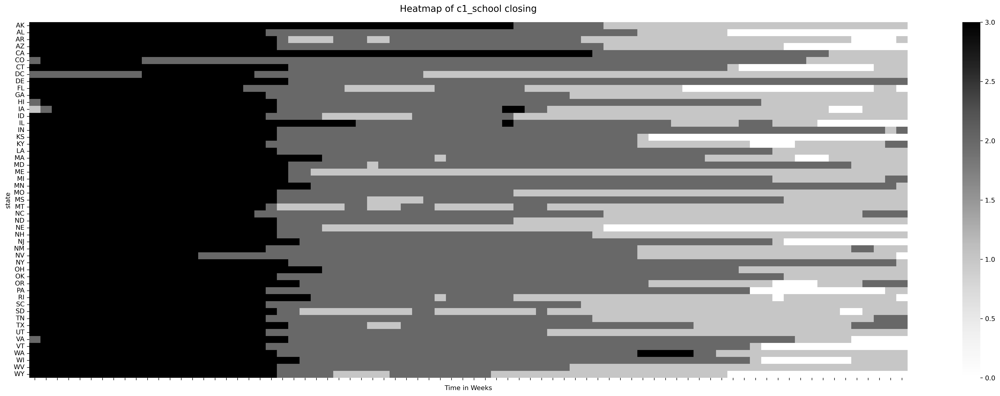

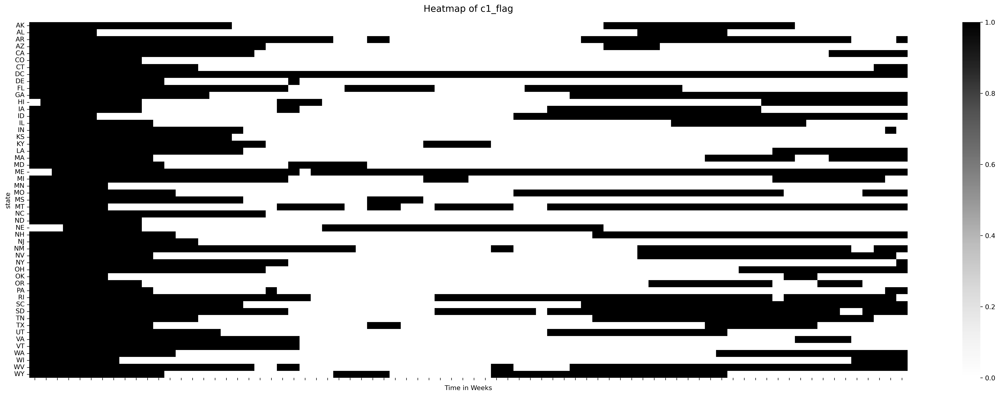

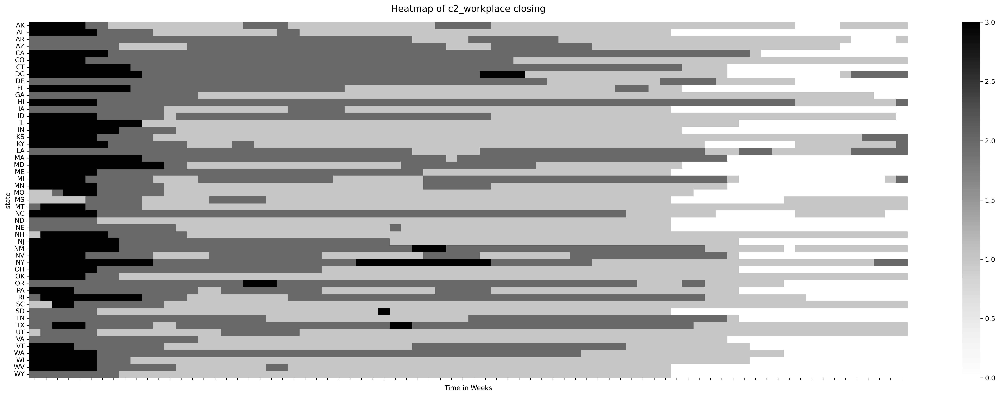

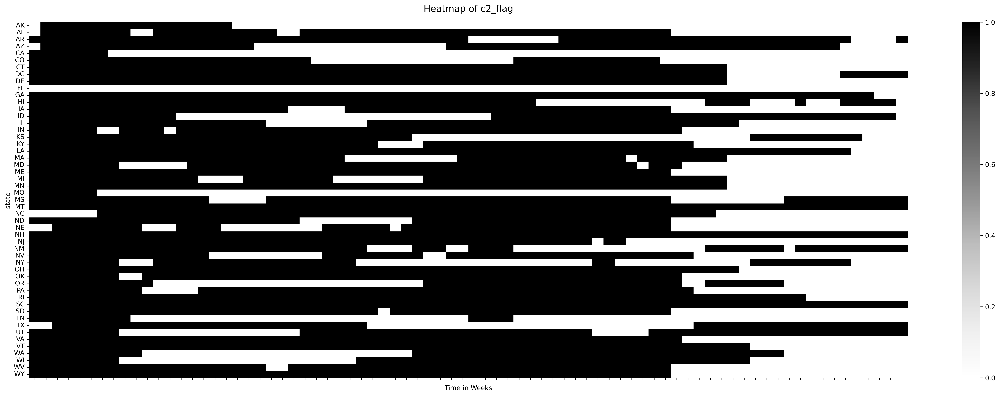

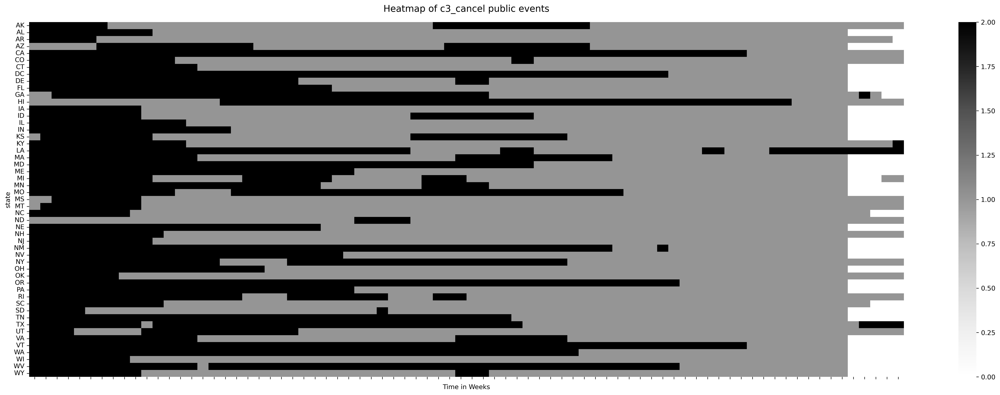

...

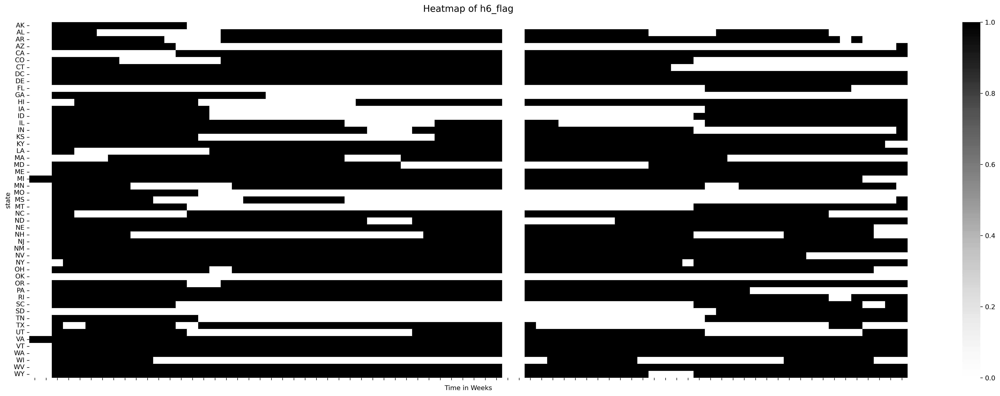

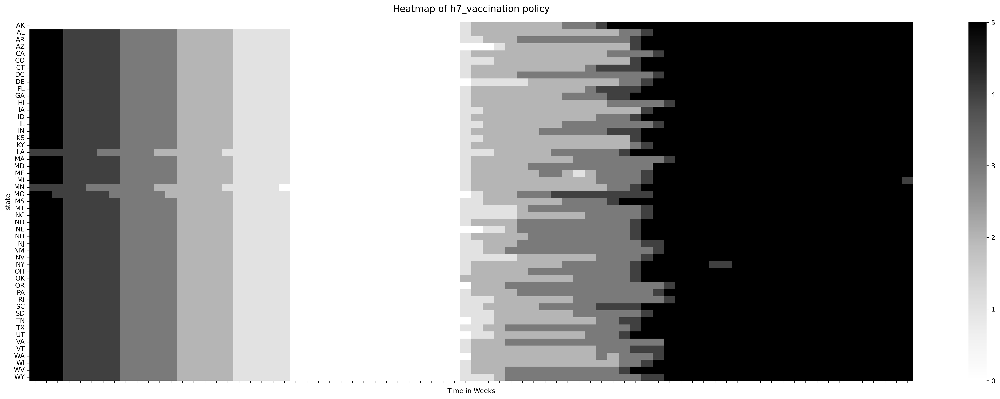

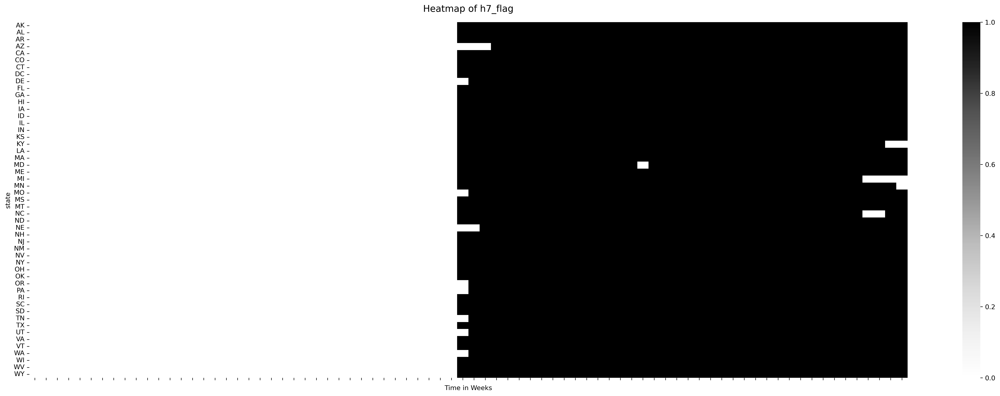

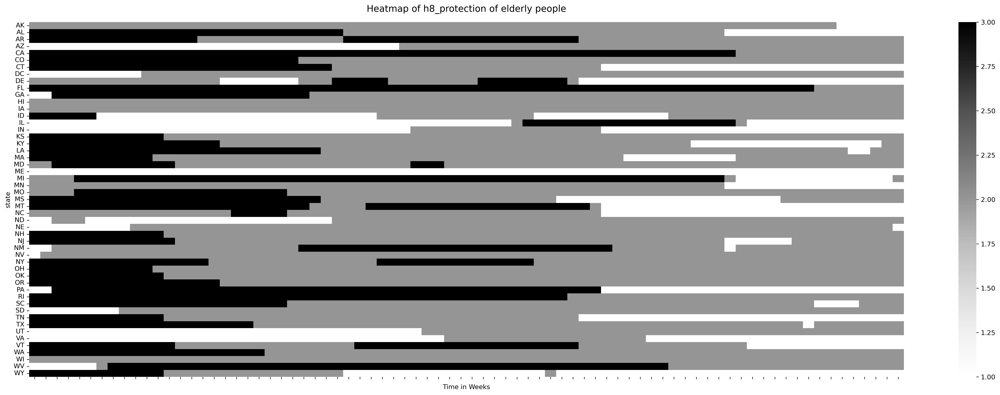

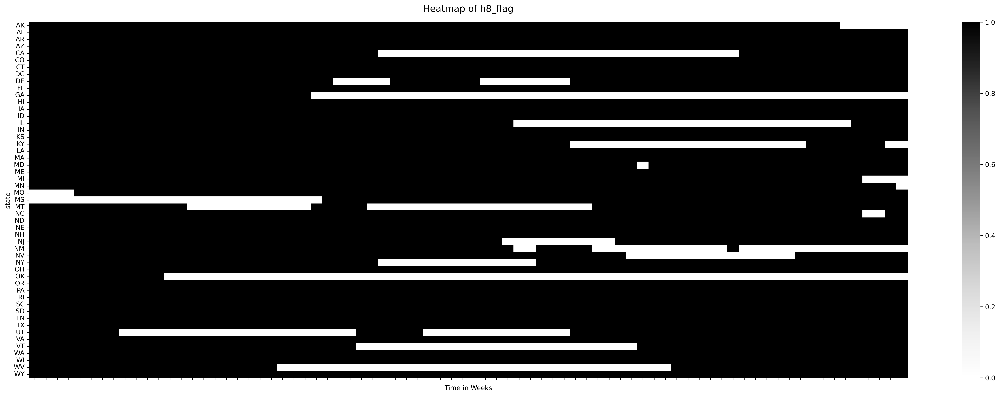

In [56]:
#covid.columns
args = ['c1_school closing', 'c1_flag', 'c2_workplace closing',
       'c2_flag', 'c3_cancel public events', 'c3_flag',
       'c4_restrictions on gatherings', 'c4_flag', 'c5_close public transport',
       'c5_flag', 'c6_stay at home requirements', 'c6_flag',
       'c7_restrictions on internal movement', 'c7_flag',
       'c8_international travel controls', 'e1_income support', 'e1_flag',
       'e2_debt/contract relief', 'h1_public information campaigns', 'h1_flag',
       'h2_testing policy', 'h3_contact tracing', 'h5_investment in vaccines',
       'h6_facial coverings', 'h6_flag', 'h7_vaccination policy', 'h7_flag',
       'h8_protection of elderly people', 'h8_flag']


indicator_heatmap(covid_state, args)

In [57]:
# remove the indicators that are not showing any sort of variability
def dropcols(covid):
    covid = covid.drop(columns = ['c8_international travel controls','h1_public information campaigns','h1_flag','h5_investment in vaccines'])
    return covid

covid = dropcols(covid)
covid_state = dropcols(covid_state)


In [58]:
# helper function: look at correlation heatmap

def corr_map(data):
    corr = data.corr()
    matrix = np.triu(corr)
    mpl.rcParams.update(mpl.rcParamsDefault)

    f, ax = plt.subplots(figsize=(30,20), dpi = 300,facecolor = 'white')
    heatmap = sns.heatmap(corr, annot=False, mask=matrix, cmap='Greys')
    heatmap.set_title('Feature Correlation Heatmap', fontdict={'fontsize':14, 'color':'black'}, pad=16)
    heatmap.tick_params(axis = 'both', color = 'black', labelcolor = 'black')
    heatmap.set_xticklabels(heatmap.get_xmajorticklabels(), fontsize = 10)
    heatmap.set_yticklabels(heatmap.get_ymajorticklabels(), fontsize = 10)


    plt.show()

########################################################################

# automating the process of removing highly correlated variables
# returns a list of features that are correlated above the percentage fed into the function

def auto_corr(data, corr_percentage):
    corr_matrix = data.corr().abs() #get the correlation matrix with absolute values

    # select just the upper triangle of the correlation matrix
    upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)) 
    #print(upper_tri) # view the columns

    # get columns with over 0.95 (95%) correlation

    #use list comprehension to get a list of ultra high correlated variables
    to_drop = [col for col in upper_tri.columns if any(upper_tri[col] > corr_percentage)] 

    # print list of variables to drop from dataframe
    print('\n These are the variables that are correlated over %s:' % corr_percentage,to_drop)
    corrs = len(to_drop)
    print('\nThere are a total of %d variables to drop due to a correlation over %s' % (corrs, corr_percentage))
    return to_drop


In [59]:
# Call correlation heatmap function

corr_map(covid)
corr_map(covid_state)

In [60]:
#Selecting variables to keep instead
#Removed 'ConfirmedCases', 'ConfirmedDeaths' since they're from Oxford dataset
#Removed flu season stuff'total_patients_hospitalized_confirmed_influenza_7_day_avg','flu_season'
#Removed 'total_beds_7_day_avg' 

cols = ['state', 'Date',
               'C1_School closing', 'C1_Flag', 'C2_Workplace closing','C2_Flag','C3_Cancel public events', 'C3_Flag',
               'C4_Restrictions on gatherings','C4_Flag','C5_Close public transport','C5_Flag',
               'C6_Stay at home requirements','C6_Flag','C7_Restrictions on internal movement','C7_Flag',
               'E1_Income support','E1_Flag','E2_Debt/contract relief',
               'H2_Testing policy','H3_Contact tracing',
               'H6_Facial Coverings','H6_Flag','H7_Vaccination policy','H7_Flag',
               'H8_Protection of elderly people','H8_Flag',
               'StringencyIndexForDisplay','GovernmentResponseIndexForDisplay','EconomicSupportIndexForDisplay',
               'inpatient_beds_7_day_avg', 'inpatient_beds_used_7_day_avg',
               'total_adult_patients_hospitalized_confirmed_covid_7_day_avg',
               'total_pediatric_patients_hospitalized_confirmed_covid_7_day_avg',
               'total_personnel_covid_vaccinated_doses_none_7_day','pfizer_auth',
               'is_corrected']
cols = [x.lower() for x in cols]
covid = covid[cols]
covid_state = covid_state[cols]
covid

,state,date,c1_school closing,c1_flag,c2_workplace closing,c2_flag,c3_cancel public events,c3_flag,c4_restrictions on gatherings,c4_flag,...,stringencyindexfordisplay,governmentresponseindexfordisplay,economicsupportindexfordisplay,inpatient_beds_7_day_avg,inpatient_beds_used_7_day_avg,total_adult_patients_hospitalized_confirmed_covid_7_day_avg,total_pediatric_patients_hospitalized_confirmed_covid_7_day_avg,total_personnel_covid_vaccinated_doses_none_7_day,pfizer_auth,is_corrected
0,US,2020-03-27,3.0,0.0,3.0,0.0,2.0,0.0,4.0,0.0,...,72.690000,63.020000,62.500000,323644.027273,192032.323217,486.700000,0.00,0.000000e+00,0,0
1,US,2020-04-03,3.0,0.0,3.0,0.0,2.0,0.0,4.0,0.0,...,72.690000,63.020000,62.500000,436718.134632,260757.585355,5388.100000,0.00,0.000000e+00,0,0
2,US,2020-04-10,3.0,0.0,3.0,0.0,2.0,0.0,4.0,0.0,...,72.690000,65.701429,62.500000,599062.521429,339512.839762,6119.616667,0.00,0.000000e+00,0,0
3,US,2020-04-17,3.0,0.0,3.0,0.0,2.0,0.0,4.0,0.0,...,72.690000,66.150000,62.500000,638175.840476,368632.876667,5399.282026,0.00,0.000000e+00,0,0
4,US,2020-04-24,3.0,0.0,3.0,0.0,2.0,0.0,4.0,0.0,...,72.690000,66.150000,62.500000,665396.435281,397140.679444,3947.295588,0.00,0.000000e+00,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73,US,2021-08-20,2.0,0.0,2.0,0.0,1.0,0.0,4.0,0.0,...,56.020000,60.420000,50.000000,700841.850000,563000.566667,107729.787500,1023.05,1.905721e+06,1,19
74,US,2021-08-27,2.0,0.0,2.0,0.0,1.0,0.0,4.0,0.0,...,56.020000,60.420000,50.000000,700789.450000,565364.133333,110992.305952,1116.70,1.860421e+06,1,16
75,US,2021-09-03,2.0,0.0,1.0,0.0,2.0,0.0,4.0,0.0,...,57.341429,61.162857,50.000000,700669.900000,561497.466667,111474.690714,1232.85,1.761541e+06,1,18
76,US,2021-09-10,2.0,0.0,1.0,0.0,2.0,0.0,4.0,0.0,...,57.870000,58.777143,28.571429,700620.400000,570513.283333,107678.845000,1063.75,1.786182e+06,1,18


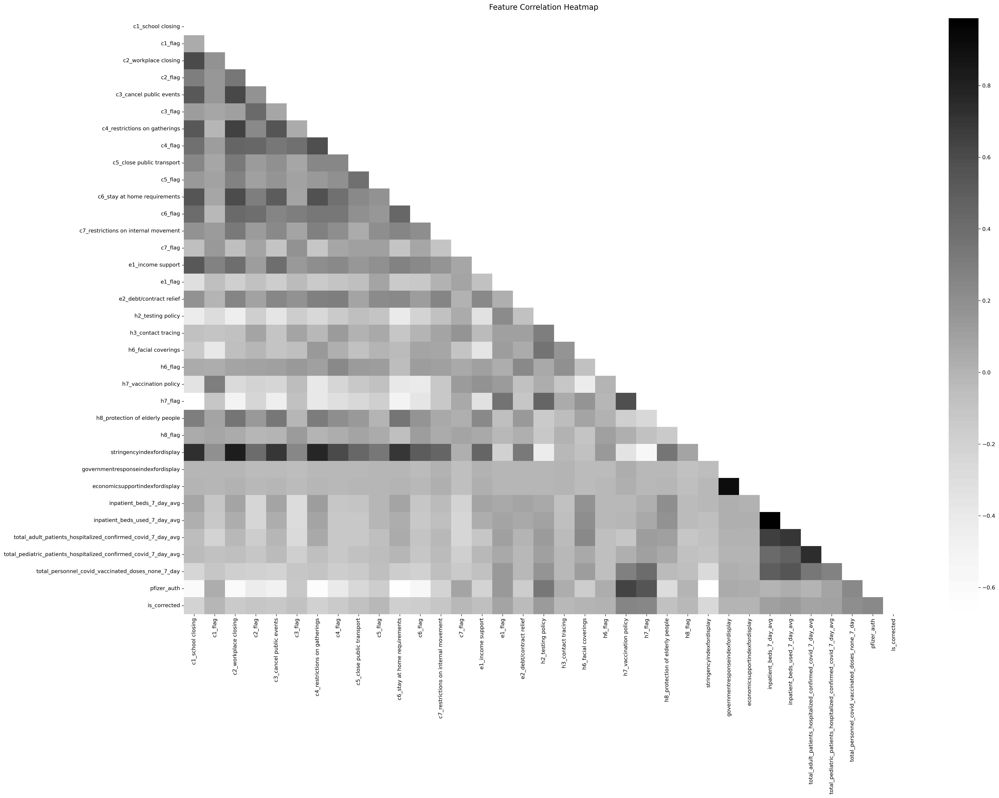

In [61]:
corr_map(covid_state)

In [62]:
# call auto correlation fucnction

correlated_features = auto_corr(covid_state, 0.9)


 These are the variables that are correlated over 0.9: ['economicsupportindexfordisplay', 'inpatient_beds_used_7_day_avg']

There are a total of 2 variables to drop due to a correlation over 0.9


In [63]:
covid = covid.drop(columns = correlated_features)
covid_state = covid_state.drop(columns = correlated_features)

In [64]:
list(covid.columns)


['state',
 'date',
 'c1_school closing',
 'c1_flag',
 'c2_workplace closing',
 'c2_flag',
 'c3_cancel public events',
 'c3_flag',
 'c4_restrictions on gatherings',
 'c4_flag',
 'c5_close public transport',
 'c5_flag',
 'c6_stay at home requirements',
 'c6_flag',
 'c7_restrictions on internal movement',
 'c7_flag',
 'e1_income support',
 'e1_flag',
 'e2_debt/contract relief',
 'h2_testing policy',
 'h3_contact tracing',
 'h6_facial coverings',
 'h6_flag',
 'h7_vaccination policy',
 'h7_flag',
 'h8_protection of elderly people',
 'h8_flag',
 'stringencyindexfordisplay',
 'governmentresponseindexfordisplay',
 'inpatient_beds_7_day_avg',
 'total_adult_patients_hospitalized_confirmed_covid_7_day_avg',
 'total_pediatric_patients_hospitalized_confirmed_covid_7_day_avg',
 'total_personnel_covid_vaccinated_doses_none_7_day',
 'pfizer_auth',
 'is_corrected']

---
### Graph to compare Cases and Deaths over time
--

In [65]:
# better explanation of why to switch from non-interactive to interactive matplotlib backend for next chart
# https://gist.github.com/CMCDragonkai/4e9464d9f32f5893d837f3de2c43daa4

import matplotlib.rcsetup as rcsetup

print(rcsetup.interactive_bk)
print(rcsetup.non_interactive_bk)
print(rcsetup.all_backends)

['GTK3Agg', 'GTK3Cairo', 'MacOSX', 'nbAgg', 'Qt4Agg', 'Qt4Cairo', 'Qt5Agg', 'Qt5Cairo', 'TkAgg', 'TkCairo', 'WebAgg', 'WX', 'WXAgg', 'WXCairo']
['agg', 'cairo', 'pdf', 'pgf', 'ps', 'svg', 'template']
['GTK3Agg', 'GTK3Cairo', 'MacOSX', 'nbAgg', 'Qt4Agg', 'Qt4Cairo', 'Qt5Agg', 'Qt5Cairo', 'TkAgg', 'TkCairo', 'WebAgg', 'WX', 'WXAgg', 'WXCairo', 'agg', 'cairo', 'pdf', 'pgf', 'ps', 'svg', 'template']


In [66]:
'''
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault) # reset the style sheet that was set for the heatmap above

import matplotlib.dates as dates

fig, ax = plt.subplots(figsize=(12,5))

# ticks every 2 months
ticks_two_mons = dates.MonthLocator(interval = 2)
ax.xaxis.set_major_locator(ticks_two_mons)

# minor ticks in between dates
ax.xaxis.set_minor_locator(dates.MonthLocator())

# format date display
ax.xaxis.set_major_formatter(dates.DateFormatter('%m-%Y'))


# plot 7-day average total inpatient beds
ax.set_xlabel('Dates')
ax.plot(covid.groupby(by='Date').sum()['inpatient_beds_7_day_avg'], color = 'black', label = 'Total Inpatient Beds')
ax.tick_params(axis='y', color = 'black')

#plot 7-day inpatient bed occupancy
ax.plot(covid.groupby(by='Date').sum()['inpatient_beds_used_7_day_avg'], color = 'blue', label = 'Occupied Inpatient Beds')
ax.tick_params(axis='y', color = 'black')

#plot 7-day adult inpatients with covid
ax.plot(covid.groupby(by='Date').sum()['total_adult_patients_hospitalized_confirmed_covid_7_day_avg'], color = 'red', label = 'Confirmed Covid Cases - Adults')
ax.tick_params(axis='y', color = 'black')

#plot 7-day pediatric inpatients with covid
ax.plot(covid.groupby(by='Date').sum()['total_pediatric_patients_hospitalized_confirmed_covid_7_day_avg'], color = 'green', label = 'Confirmed Covid Cases - Pediatric')
ax.tick_params(axis='y', color = 'black')

#plot 7-day total flu cases
ax.plot(covid.groupby(by='Date').sum()['total_patients_hospitalized_confirmed_influenza_7_day_avg'], color = 'gray', label = 'All Flu Cases')
ax.tick_params(axis='y', color = 'black')

#plot 7-day total Confirmed cases from Oxford data set
#ax.plot(covid.groupby(by='Date').sum()['ConfirmedCases'], color = 'orange', label = 'Oxford Confirmed Cases')
#ax.tick_params(axis='y', color = 'orange')


#ax.set_title('Total Beds 7-Day Average by Date in the USA 01-01-24 thru 05-28-21')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
mpl.rcParams.update({'font.size': 14})

plt.legend()
plt.show()
'''
print('')

In [67]:
'''
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault) # reset the style sheet that was set for the heatmap above

import matplotlib.dates as dates

fig, ax = plt.subplots(figsize=(12,5))

# ticks every 2 months
ticks_two_mons = dates.MonthLocator(interval = 2)
ax.xaxis.set_major_locator(ticks_two_mons)

# minor ticks in between dates
ax.xaxis.set_minor_locator(dates.MonthLocator())

# format date display
ax.xaxis.set_major_formatter(dates.DateFormatter('%m-%Y'))


# plot 7-day average total inpatient beds
ax.set_xlabel('Dates')
ax.plot(covid.groupby(by='Date').sum()['inpatient_beds_7_day_avg'], color = 'black', label = 'Total Inpatient Beds')
ax.tick_params(axis='y', color = 'black')

#plot 7-day inpatient bed occupancy
ax.plot(covid.groupby(by='Date').sum()['inpatient_beds_used_7_day_avg'], color = 'blue', label = 'Occupied Inpatient Beds')
ax.tick_params(axis='y', color = 'black')

#plot 7-day adult inpatients with covid
ax.plot(covid.groupby(by='Date').sum()['total_adult_patients_hospitalized_confirmed_covid_7_day_avg'], color = 'red', label = 'Confirmed Covid Cases - Adults')
ax.tick_params(axis='y', color = 'black')

#plot 7-day pediatric inpatients with covid
ax.plot(covid.groupby(by='Date').sum()['total_pediatric_patients_hospitalized_confirmed_covid_7_day_avg'], color = 'green', label = 'Confirmed Covid Cases - Pediatric')
ax.tick_params(axis='y', color = 'black')

#plot 7-day total flu cases
ax.plot(covid.groupby(by='Date').sum()['total_patients_hospitalized_confirmed_influenza_7_day_avg'], color = 'gray', label = 'All Flu Cases')
ax.tick_params(axis='y', color = 'black')

#plot 7-day total Confirmed cases from Oxford data set
ax.plot(covid.groupby(by='Date').sum()['ConfirmedCases'], color = 'orange', label = 'Oxford Confirmed Cases')
ax.tick_params(axis='y', color = 'orange')


#ax.set_title('Total Beds 7-Day Average by Date in the USA 01-01-24 thru 05-28-21')
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
mpl.rcParams.update({'font.size': 14})

plt.legend()
plt.show()
'''
print('')

In [68]:
# get an idea of how the cases and deaths align over time when scaled
'''
mpl.use('Qt5Agg')  # switch to an interactive backend, the default is agg and that is not interactive
mpl.rcParams.update(mpl.rcParamsDefault) # reset the style sheet that was set for the heatmap above

import matplotlib.pyplot as plt  # re-import pyplot

#mpl.rcParams.update(mpl.rcParamsDefault) # reset the style sheet that was set for the heatmap above
fig, ax1 = plt.subplots(figsize=(12,5))

# plot conf_cases
ax1.set_xlabel('Dates')
ax1.set_ylabel('Confirmed Cases')
ax1.plot(oxford.groupby(by='Date').sum()['ConfirmedCases'], '.-', color = 'black', label = 'Conf_Cases')
ax1.tick_params(axis='y', labelcolor = 'black')
ax1.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))

# add additional axes to same plot
ax2 = ax1.twinx()

# plot conf_deaths
ax2.set_ylabel('Confirmed Deaths')
ax2.plot(oxford.groupby(by='Date').sum()['ConfirmedDeaths'], '--', color = 'black', label = 'Conf_Deaths')
ax2.tick_params(axis='y', labelcolor='black')
ax2.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))



# prevent any offsets
fig.tight_layout()

# get plotted objects and their labels
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='lower right')
ax2.set_title('Explore the Similarity in Tranjectories of Cases and Deaths')
ax2.legend(lines + lines2, labels + labels2, loc=0)

formatter = mpl.dates.DateFormatter("%b %y") # format date into 3-letter month using %b, 2 digit year using %y  (%Y is the 4-digit year)
ax2.xaxis.set_major_formatter(formatter)  # format the date on the xaxis

plt.show()
'''
print('')

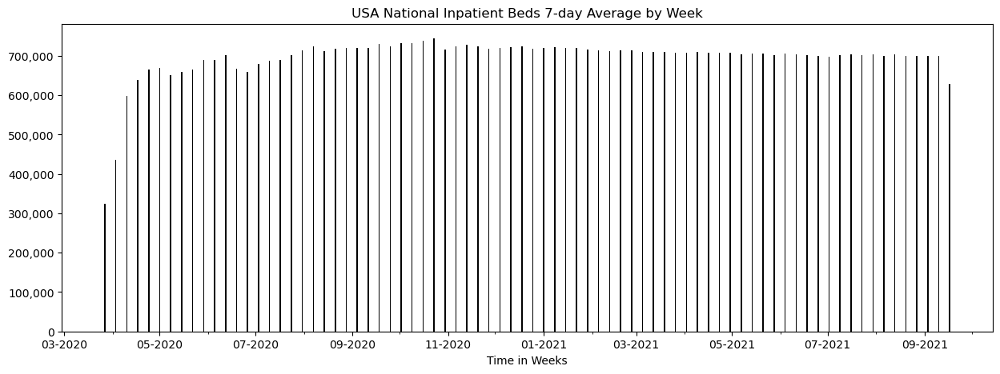

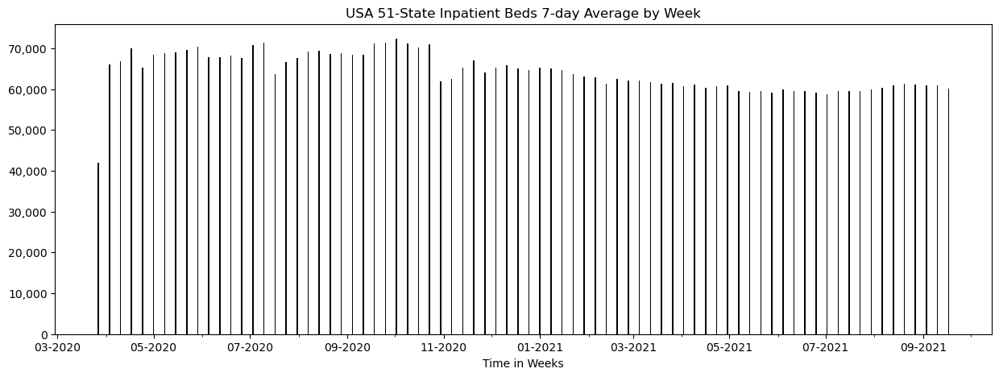

In [69]:
mpl.use('Qt5Agg')  # switch to an interactive backend, the default is agg and that is not interactive
mpl.rcParams.update(mpl.rcParamsDefault) # reset the style sheet that was set for the heatmap above

import matplotlib.pyplot as plt  # re-import pyplot

import matplotlib.dates as dates

def nat_inpat_beds(data, title_t):
    fig, ax = plt.subplots(figsize = (15,5))

    ax.bar(data.date, data.inpatient_beds_7_day_avg, label = "line 1", linestyle="-", color = 'black', linewidth=2)

    # ticks every 2 months
    ticks_two_mons = dates.MonthLocator(interval = 2)
    ax.xaxis.set_major_locator(ticks_two_mons)
    ax.set_title(title_t)
    ax.set_xlabel('Time in Weeks')
    ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))

    # minor ticks in between dates
    ax.xaxis.set_minor_locator(dates.MonthLocator())

    # format date display
    ax.xaxis.set_major_formatter(dates.DateFormatter('%m-%Y'))

    plt.show()
    
nat_inpat_beds(covid, 'USA National Inpatient Beds 7-day Average by Week')
nat_inpat_beds(covid_state, 'USA 51-State Inpatient Beds 7-day Average by Week')

In [70]:
#covid.plot('date', 'inpatient_beds_7_day_avg', label = "line 1", linestyle="-")

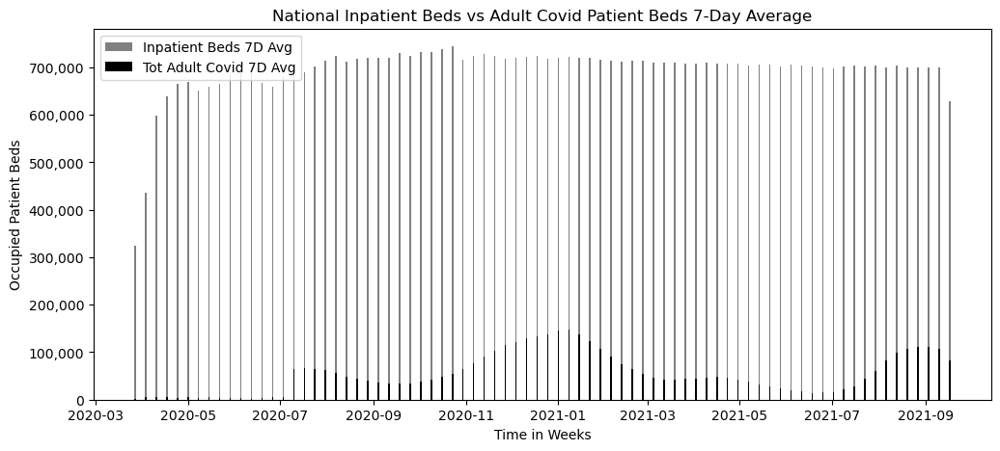

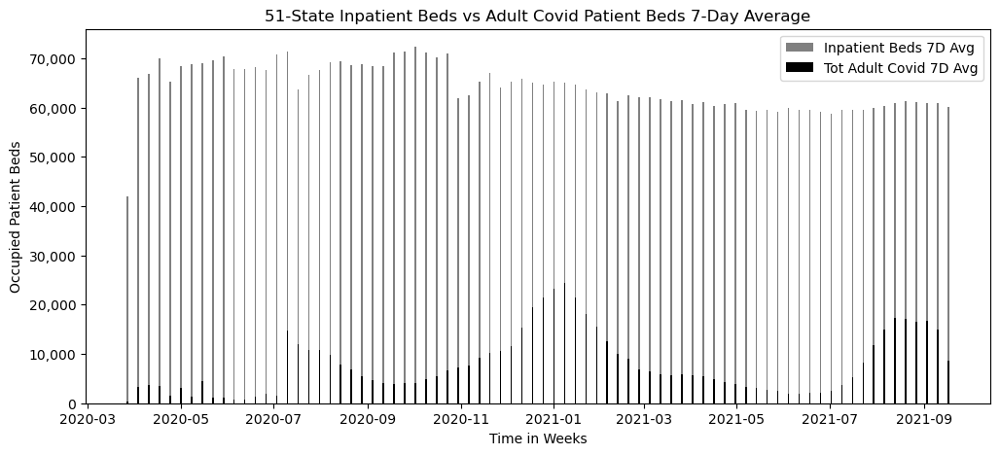

In [71]:
#New plot
#covid.plot(x="Date", y=["inpatient_beds_7_day_avg", "total_adult_patients_hospitalized_confirmed_covid_7_day_avg"],
#        kind="bar", figsize=(11, 11))


#mpl.rcParams.update(mpl.rcParamsDefault) # reset the style sheet that was set for the heatmap above
def inpat_vs_conf_covid(data, title_t):
    fig, ax = plt.subplots(figsize=(12,5))

    labels = data['date']
    pat_bed = data['inpatient_beds_7_day_avg']
    covid_bed = data['total_adult_patients_hospitalized_confirmed_covid_7_day_avg']
    width = 1

    # plot conf_cases
    ax.set_title(title_t)
    ax.set_xlabel('Time in Weeks')
    ax.set_ylabel('Occupied Patient Beds')
    ax.bar(labels, pat_bed ,    width,   label = "Inpatient Beds 7D Avg",     color = 'grey')
    ax.bar(labels, covid_bed,   width,   label = "Tot Adult Covid 7D Avg",color = 'black')#, bottom = covid_bed)
    ax.tick_params(axis='y', labelcolor = 'black')
    ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
    ax.legend()

    formatter = mpl.dates.DateFormatter("%b %y") # format date into 3-letter month using %b, 2 digit year using %y  (%Y is the 4-digit year)


    plt.show()
    
inpat_vs_conf_covid(covid, 'National Inpatient Beds vs Adult Covid Patient Beds 7-Day Average')
inpat_vs_conf_covid(covid_state, '51-State Inpatient Beds vs Adult Covid Patient Beds 7-Day Average')


In [72]:
%%time

from pandas_profiling import ProfileReport

profile = ProfileReport(covid, minimal=True, title='COVID Dataset Profiling Report for Capstone A')


Wall time: 1.59 s


In [73]:
profile.to_notebook_iframe()

Render HTML: 100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


In [74]:
np.min(covid.date), np.max(covid.date)

(Timestamp('2020-03-27 00:00:00'), Timestamp('2021-09-17 00:00:00'))

In [75]:
#profile.to_file('covid_dataset_profile.html')

In [76]:
# make a backup copy of the covid dataframe for EDA later on while columns that may've been dropped later on are still in tact for post processing

eda = copy.deepcopy(covid)

---
# <font color='blue'> Model Building and Evaluation </font>
## <font color='blue'>Data Prep</font>

In [77]:
# use the rest of the datetime data because we can't use datetime data in the regressors
natmodel = copy.deepcopy(covid)
stmodel = copy.deepcopy(covid_state)




In [78]:
natmodel.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 78 entries, 0 to 77
Data columns (total 35 columns):
 #   Column                                                           Non-Null Count  Dtype         
---  ------                                                           --------------  -----         
 0   state                                                            78 non-null     object        
 1   date                                                             78 non-null     datetime64[ns]
 2   c1_school closing                                                78 non-null     float64       
 3   c1_flag                                                          78 non-null     float64       
 4   c2_workplace closing                                             78 non-null     float64       
 5   c2_flag                                                          78 non-null     float64       
 6   c3_cancel public events                                          78 non-null     flo

In [79]:
# break up the dataset

TARGET = stmodel.total_adult_patients_hospitalized_confirmed_covid_7_day_avg
DATA = stmodel.drop(columns = 'total_adult_patients_hospitalized_confirmed_covid_7_day_avg')
#DATA.info()

In [80]:
# making sure we aren't working with copies and only original df's
bool(DATA._is_copy), bool(TARGET._is_copy)

(False, False)

In [81]:
#cat = np.array(DATA.iloc[:,0])
#np.reshape(cat, (-1,1))
#len(DATA), DATA.state.tail(12), DATA.state.())
DATA.iloc[:,[0,1]]

,state,date
0,AK,2020-03-27
1,AK,2020-04-03
2,AK,2020-04-10
3,AK,2020-04-17
4,AK,2020-04-24
...,...,...
3973,WY,2021-08-20
3974,WY,2021-08-27
3975,WY,2021-09-03
3976,WY,2021-09-10


In [82]:
# Train Test Split
from sklearn.preprocessing import StandardScaler, OrdinalEncoder, LabelEncoder
#from sklearn.model_selection import train_test_split  # no longer neede because we are working with time series data
def traintestsplit(DATA):
    
    train = round(len(DATA) * .75)
    test = len(DATA) - train
    
    # split the data
    x_train = DATA.head(train)
    x_test = DATA.tail(test)
    y_train = TARGET.head(train)
    y_test = TARGET.tail(test)

    # avoid setting off error warnings
    x_train = copy.deepcopy(x_train)
    x_test = copy.deepcopy(x_test)

    # numerical columns
    x_train = copy.deepcopy(x_train.iloc[:, 2:])
    x_test = copy.deepcopy(x_test.iloc[:, 2:])


    # standardscaler input variables
    standardscaler = StandardScaler()
    standardscaler.fit(x_train)
    x_train = standardscaler.transform(x_train)
    x_test = standardscaler.transform(x_test)

    return x_train, x_test, y_train, y_test
    
x_train, x_test, y_train, y_test = traintestsplit(DATA)



In [83]:
np.isnan(x_train).sum(), np.isnan(x_test).sum(), np.isnan(y_train).sum(), np.isnan(y_test).sum(), DATA.isna().sum().sum()

(0, 0, 0, 0, 0)

In [84]:
np.where(covid.isna())

(array([], dtype=int64), array([], dtype=int64))

In [85]:
x_train.shape, x_test.shape


((2984, 32), (994, 32))

---
# <font color='blue'> Modeling </font>
## <font color='blue'> Linear Regression </font>



In [86]:
%%time 
# linear regression
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import mean_squared_error



linear_reg = LinearRegression()
linear_reg.fit(x_train, y_train)
linear_preds = linear_reg.predict(x_test)
linear_reg.get_params()
r2_score = linear_reg.score(x_test, y_test) # R2 score
cv_score = cross_val_score(linear_reg, x_test, y_test, cv=5, scoring = 'r2')
print('R-square score: %s' % r2_score)
print('cv_score: %s' % cv_score)


R-square score: 0.8115860310800971
cv_score: [ 0.45698877  0.59417008  0.81836327 -1.19149401 -2.15542178]
Wall time: 198 ms


In [102]:
#linear_reg.coef_.tolist()

In [101]:

d = {'features': list(DATA.iloc[:,2:].columns), 'coef': linear_reg.coef_}
importance = pd.DataFrame(data=d)

# return abs value of coef's
importance['abs_coef'] = abs(importance.coef)


# rank coef based on absolute value
importance['rank'] = importance['abs_coef'].rank(axis = 0, method = 'average', ascending = False, numeric_only = True)
#importance

# view the ranking of the feautes by abs value of coef
importance[['features','coef','rank']].sort_values(by = ['rank'])

,features,coef,rank
28,total_pediatric_patients_hospitalized_confirme...,922.476188,1.0
27,inpatient_beds_7_day_avg,792.293154,2.0
21,h7_vaccination policy,-582.900608,3.0
22,h7_flag,466.352106,4.0
25,stringencyindexfordisplay,385.246367,5.0
0,c1_school closing,-172.662225,6.0
5,c3_flag,-123.397428,7.0
1,c1_flag,-110.659460,8.0
8,c5_close public transport,-109.121821,9.0
11,c6_flag,-107.683894,10.0
